# Моделирование орбит

In [1]:
import math
import random
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from PIL import Image
from IPython.display import clear_output
from IPython.core.interactiveshell import InteractiveShell
from IPython import display

InteractiveShell.ast_node_interactivity = "all"

G = 0.1

In [2]:
def acceleration(m, r):
    """
    The auxiliary function to calculate acceleration according to Newton's law of gravitation.

    Parameters
    ----------
    m : mass of attracting object
    r : distance between bodies

    Returns
    -------
    float64: value of acceleration
    """
    return G * m * r / np.linalg.norm(r) ** 3


def my_round(arr, k):
    """
    The auxiliary function to round all array elements.

    Parameters
    ----------
    arr : array
    k : degree of rounding

    Returns
    -------
    numpy.array: rounded array
    """
    return [round(arr[i], k) for i in range(len(arr))]


class Body:
    """
    The class describes body's parameters in space.

    Attributes
    ----------
    mass : mass
    r : dimension of space vector of coordinates
        Default value: zeros

    v: dimension of space vector of velocity
        Default value: zeros

    R: the radius of object itself (primarily for Sun)
        Default value: zero

    coordinates: an array of the dimension size of the space for storing coordinate values

    exist: the value of bool to determine whether the body exists or not
    """

    def __init__(self, dim, mass=0, r=None, v=None, R=0):
        if r is None: r = np.zeros(dim)
        if v is None: v = np.zeros(dim)
        self.mass, self.r, self.v, self.R = mass, r, v, R
        self.coordinates = [[self.r[i]] for i in range(dim)]
        self.exist = 1

    def __str__(self):
        """
        The auxiliary function to show information about body's parameters.

        Returns
        -------
        string
        """
        return f"Mass: {round(self.mass, 2)}; Coordinates: {my_round(self.r, 2)}; Velocity: {my_round(self.v, 2)}"

    def E_kin(self):
        """
        The auxiliary function to calculate value of kinetic energy of body.

        Returns
        -------
        float64: value of kinetic energy.
        """
        return self.mass * np.linalg.norm(self.v) ** 2 / 2

    def if_destroyed(self, R):
        """
        The auxiliary function to check whether the body is encountered with the Sun.
        If body was destroyed, then set mass, velocity and existence value to zero.

        Parameters
        ----------
        R : radius of the Sun

        """
        if np.linalg.norm(self.r) <= R:
            self.mass, self.v, self.exist = 0, np.zeros(len(self.r)), 0


def E_pot(body1, body2):
    """
    The auxiliary function to calulate potential energy of interaction between two bodies.

    Parameters
    ----------
    body1 : object of class Body
    body2 : object of class Body

    Returns
    -------
    float64: value of energy
    """
    return G * body1.mass * body2.mass / np.linalg.norm(body2.r - body1.r)


def E_full(body1, body2):
    """
    The auxiliary function to calculate full energy of system of two bodies.

    Parameters
    ----------
    body1 : object of class Body
    body2 : object of class Body

    Returns
    -------
    float64: value of energy
    """
    return -E_pot(body1, body2) + body1.E_kin() + body2.E_kin()


def gravitate(Sun: Body, system: list, dt):
    """
    The basic function to calculate coordinates and velocity changes after interaction.

    Parameters
    ----------
    Sun : object of class Body
    system : list of objects of class Body
    dt : delta time — value of discretization of time
    """
    # Create buffer copies of bodies in order to take into account changes in the position of bodies
    buf_system = system
    # In the next cycle, the interaction between the bodies and the sun is considered first
    for i in range(len(system)):
        dv = acceleration(Sun.mass, Sun.r - buf_system[i].r) * dt * buf_system[i].exist
        system[i].v += dv
        system[i].r += buf_system[i].v * dt
        # Append new coordinates to list
        for k in range(len(system[i].r)): system[i].coordinates[k].append(system[i].r[k])
        # Calculate interactions between bodies (except with itself)
        for j in [j for j in range(len(system)) if j != i]:
            dv = acceleration(buf_system[i].mass, buf_system[i].r - buf_system[j].r) * dt
            system[j].v += dv
            system[j].r += buf_system[j].v * dt
            for k in range(len(system[i].r)): system[i].coordinates[k].append(system[i].r[k])
        # Check whether the body exists or not
        system[i].if_destroyed(Sun.R)

In [3]:
def plotter(dim, Sun, system):
    """
    The basic function to plot orbits of bodies.
    Can be used for 2 and 3 dimensional space.
    Show plot.

    Parameters
    ----------
    dim : 2 or 3
        Dimension of space
    Sun : object of class Body
    system : list of objects of class Body
    """
    if dim == 2:
        plt.figure(figsize=(10, 10))
        plt.xlim(-10, 10)
        plt.ylim(-10, 10)
        circle = plt.Circle((0, 0), Sun.R, color='r')
        plt.gca().add_patch(circle)
        for i in range(len(system)):
            plt.scatter(system[i].coordinates[0], system[i].coordinates[1], s=1)
    if dim == 3:
        fig = plt.figure(figsize=(10, 10))
        ax = fig.add_subplot(111, projection='3d')
        ax.axes.set_xlim3d(-10, 10)
        ax.axes.set_ylim3d(-10, 10)
        ax.axes.set_zlim3d(-8, 8)

        u = np.linspace(0, 2 * np.pi, 100)
        v = np.linspace(0, np.pi, 100)

        x = Sun.R * np.outer(np.cos(u), np.sin(v))
        y = Sun.R * np.outer(np.sin(u), np.sin(v))
        z = Sun.R * np.outer(np.ones(np.size(u)), np.cos(v))
        ax.plot_surface(x, y, z, rstride=4, cstride=4, color='r', linewidth=0, alpha=0.5)
        ax.plot_surface(x, y, -z, rstride=4, cstride=4, color='r', linewidth=0, alpha=0.5)

        for i in range(len(system)):
            ax.scatter(system[i].coordinates[0], system[i].coordinates[1], system[i].coordinates[2], s=1)
    plt.show()

Проведем первый тест. Разместим точечные массы со случайными координатам. Проверим выполнение ЗСЭ с точностью k за n итераций.

Mass: 6.77; Coordinates: [0.01, -0.32, -0.08]; Velocity: [0.68, 0.43, 0.63]
Mass: 7.85; Coordinates: [-0.38, -0.38, 0.34]; Velocity: [0.5, 0.96, -0.47]
Начальная энергия системы: -0.22698470267621929
Конечная энергия системы: -1.0184859168070624
За 10000 итераций набежала ошибка в 471.4009179651103 процентов


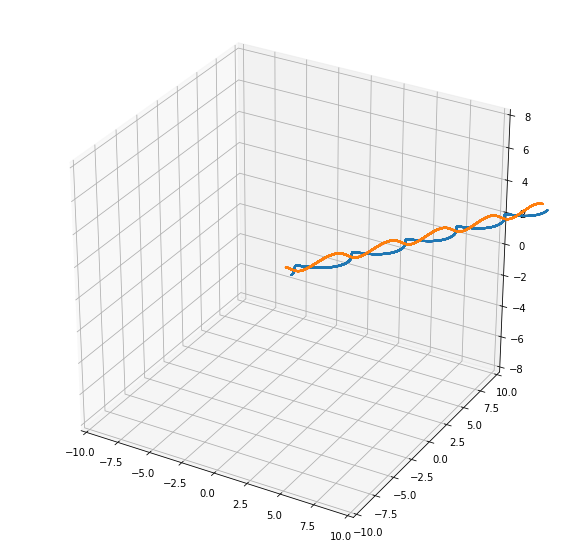

Mass: 6.77; Coordinates: [11.7, 14.22, 0.97]; Velocity: [0.67, 0.44, 0.71]
Mass: 7.85; Coordinates: [11.34, 14.19, 1.3]; Velocity: [0.52, 1.01, -0.5]


In [25]:
def test1(dim, k, n):
    """
    The first test function. Create two bodies with random parameters and calculate interaction until the error exceeds k percent or it reaches n iterations.
    Can be used for 2 and 3 dimensional space.

    Parameters
    ----------
    dim : dimension of space
    k : percent of allowed error of energy
    n : number of iterations
    """
    random.seed(19)
    body1 = Body(dim=dim, mass=random.random() * 10, r=(np.random.rand(dim) - 0.5) * 2,
                 v=(np.random.rand(dim) - 0.5) * 2)
    body2 = Body(dim=dim, mass=random.random() * 10, r=(np.random.rand(dim) - 0.5) * 1,
                 v=(np.random.rand(dim) - 0.5) * 2)
    print(body1)
    print(body2)
    E0 = E_full(body1, body2)
    print(f'Начальная энергия системы: {E0}')
    i = 0
    while math.fabs(E0 - E_full(body1, body2)) < k * math.fabs(E0) and i < n:
        gravitate(Sun=Body(dim=dim, mass=0), system=[body1, body2], dt=1e-3)
        # assert math.fabs(E0 - E_full(body1, body2)) < 0.1, 'ЗСЭ сломался...'
        # print(E_full(body1, body2))
        i += 1

    print(f'Конечная энергия системы: {E_full(body1, body2)}')
    if i < n:
        print(f"Ошибка в {k * 100} процент(ов) набежала за {i} итераций")
    else:
        print(f"За {i} итераций набежала ошибка в {math.fabs(E0 - E_full(body1, body2) / E0) * 100} процентов")

    plotter(dim=dim, Sun=Body(dim, mass=0, R=0), system=[body1, body2])

    print(body1)
    print(body2)


test1(dim=3, k=100, n=1e4)

Теперь изобразим планетарную систему с определенными параметрами.

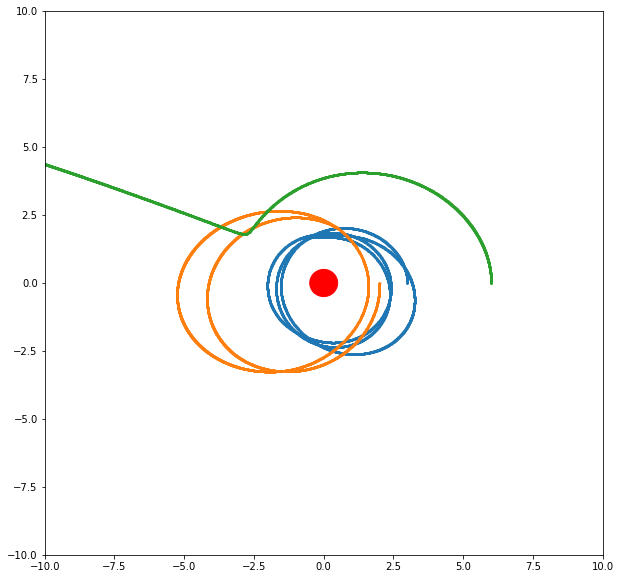

In [5]:
def test2():
    """
    The second test function in 2-dim space. Create list of bodies with determined parameters and calculate interaction for a certain amount of time.
    """
    dt = 1e-3
    Sun = Body(dim=2, mass=1000, R=0.5)
    Earth = Body(dim=2, mass=50, r=[3., 0.], v=[0., 3])
    comet = Body(dim=2, mass=1, r=[6., 0.], v=[0., 2])
    Venus = Body(dim=2, mass=80, r=[2., 0.], v=[0., -5])
    system = [Earth, Venus, comet]
    for t in np.arange(0., 4., dt):
        gravitate(Sun=Sun, system=system, dt=dt)
    clear_output(wait=True)
    plotter(dim=2, Sun=Sun, system=system)


test2()

Изобразим планетарную систему с планетами, возникающими случайно.

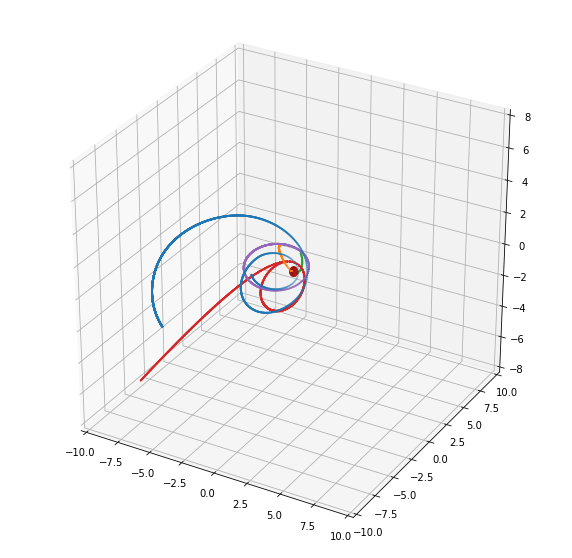

In [27]:
def test3(dim):
    """
    The third test function. Create the Sun and the first body and random list of times in which will be created new random bodies.
    Can be used for 2 and 3 dimensional space.

    Parameters
    ----------
    dim : dimension of space
    """
    dt = 5e-3
    t0 = 5.
    random.seed(10)
    Sun = Body(dim=dim, mass=1000, R=0.3)
    system = [Body(dim=dim, mass=random.random() * 10, r=(np.random.rand(dim) - 0.5) * 5,
                   v=(np.random.rand(dim) - 0.5) * 5)]
    r = [int(random.random() * t0 / dt) * (1 + i - i) * dt for i in range(4)]

    for t in np.arange(0., t0, dt):
        if t in r:
            system.append(
                Body(dim=dim, mass=random.random() * 10, r=(np.random.rand(dim) - 0.5) * 5,
                     v=(np.random.rand(dim) - 0.5) * 5))
        gravitate(Sun=Sun, system=system, dt=dt)
    # clear_output(wait=True)
    plotter(dim=dim, Sun=Sun, system=system)


test3(dim=3)

# Детектирование орбит
![Вырезка из Механики Сивухина](https://www.notion.so/image/https%3A%2F%2Fs3-us-west-2.amazonaws.com%2Fsecure.notion-static.com%2Fa2187199-ccab-4716-96e4-47ad743390f2%2FUntitled.png?table=block&id=21a00b06-e814-4faa-9670-1d1bf788a2ed&spaceId=9b31c034-a12a-4a00-aa06-94d40481c90f&width=2000&userId=091be9fe-15b8-4388-9b1c-f8c26db2761b&cache=v2)
Космическое тело в поле тяготения звезды может двигаться по орбитам, являющимся коническими сечениями, т.е. по эллипсу (эксцентриситет e < 1), параболе (e = 1) и гиперболе (e > 1) (см. [1, стр. 312]. При этом в двух последних случаях тело покидает сферу влияния звезды. Тип орбиты можно определить по кинетической энергии [1, стр. 316]:
$$E = \dfrac{mv^2}{2} - G\dfrac{mM}{r} = \text{const}\\
\begin{cases}
E > 0, \text{  гипербола}\\
E = 0, \text{  парабола}\\
E < 0, \text{  эллипс}\\
\end{cases}$$

1. Сивухин Д. В. Общий курс физики, т.1. Механика. М.: 1979. 520 с.

Mass: 28.57; Coordinates: [4.36, 5.0, 3.87]; Velocity: [0.76, 1.72, -0.27]
Elliptic


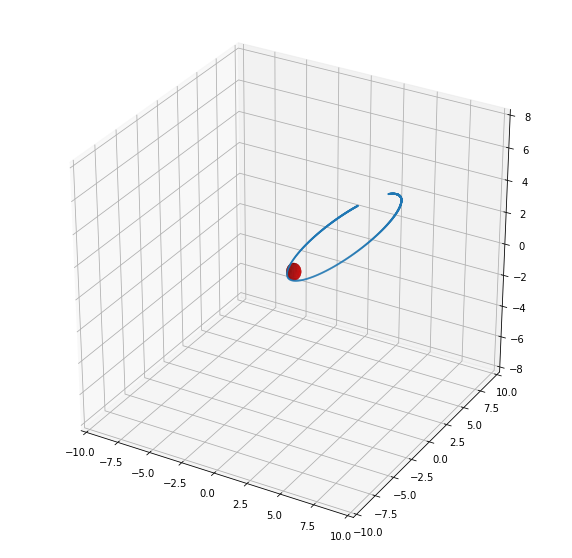

In [29]:
def orbit_type(Sun, body):
    """
    The auxiliary function to find orbit type of body.
    Calculate full energy of system and print orbit type.
    Can be used for 2 and 3 dimensional space.

    Parameters
    ----------
    Sun : object of class Body
    body : object of class Body

    Returns
    -------
    str: type of orbit
    """
    E = E_full(Sun, body)
    if E > 0:
        print('Hyperbolic')
    elif E < 0:
        print('Elliptic')
    else:
        print('Parabolic')


def test4(dim):
    """
    The fourth test function which defines the type of orbit.
    Can be used for 2 and 3 dimensional space.

    Parameters
    ----------
    dim : dimension of space
    """
    dt = 5e-3
    t0 = 5.
    random.seed(10)

    Sun = Body(dim=dim, mass=1000, R=0.5)
    system = [Body(dim=dim, mass=random.random() * 50, r=(np.random.rand(dim) - 0.5) * 10,
                   v=(np.random.rand(dim) - 0.5) * 7)]
    print(system[0])
    orbit_type(Sun, system[0])

    for t in np.arange(0., t0, dt):
        gravitate(Sun=Sun, system=system, dt=dt)
    # clear_output(wait=True)
    plotter(dim=dim, Sun=Sun, system=system)


test4(dim=3)

Теперь найдем минимальную скорость, необходимую для того, чтобы тело с заданной массой и координатой вышла на эллиптическую орбиту, т. е. начальное положение было апогелием, а перигелий был равен радиусу звезды:
$$v_{ap} = \sqrt{2GM\dfrac{r_p}{r_a(r_a + r_p)}}$$
Код снизу создает тело в случайной точке и придает ему минимальную скорость (перпендикулярно радиус-вектору), необходимую, чтобы не врезаться в Солнце.

Mass: 5.71; Coordinates: [7.55, 2.35]; Velocity: [-0.52, 1.68]


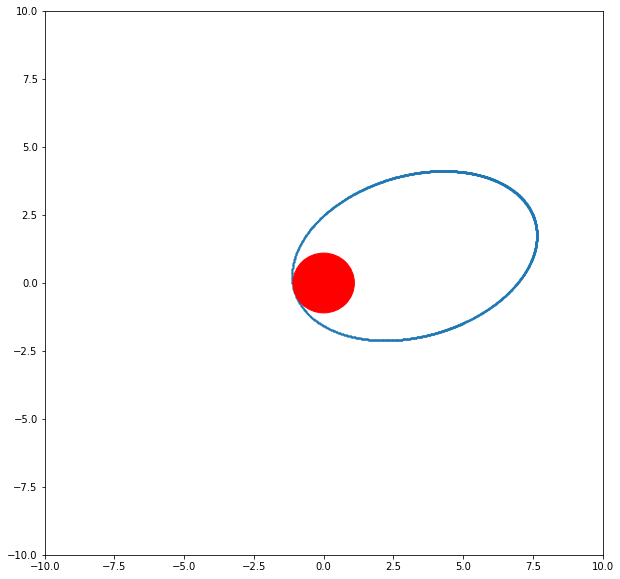

Elliptic
None


In [32]:
def opt_velocity(Sun, body):
    """
    The auxiliary function to calculate minimal velocity in order not to be destroyed.
    Returns module of velocity, which should be directed perpendicular to the radius vector of the body.

    Parameters
    ----------
    Sun : object of class Body
    body : object of class Body

    Returns
    -------
    float64: module of velocity
    """
    e = (np.linalg.norm(body.r) - Sun.R) / (np.linalg.norm(body.r) + Sun.R)  # eccentricity of the orbit
    return math.sqrt(math.fabs(2 * G * Sun.mass * (1 - e) / (1 + e) / (Sun.R + np.linalg.norm(body.r))))


def test5(dim):
    """
    The fifth test function which show orbit with minimal velocity.
    Can be used for 2 and 3 dimensional space.

    Parameters
    ----------
    dim : dimension of space
    """
    dt = 5e-3
    t0 = 10
    random.seed(10)

    Sun = Body(dim=dim, mass=1000, R=1.1)
    comet = Body(dim=dim, mass=random.random() * 10, r=(np.random.rand(dim) - 0.5) * 2)
    comet.r = Sun.R * comet.r / np.linalg.norm(comet.r) + 10 * comet.r
    # Set direction of vector of velocity
    if dim == 2:
        comet.v = np.array([-comet.r[1], comet.r[0]])
    if dim == 3:
        comet.v = np.array([-comet.r[1], comet.r[0], 0])
    # Normalize velocity vector and multiply with velocity module
    comet.v *= opt_velocity(Sun, comet) / np.linalg.norm(comet.v)
    print(comet)

    for t in np.arange(0., t0, dt):
        gravitate(Sun=Sun, system=[comet], dt=dt)

    # clear_output(wait=True)
    plotter(dim=dim, Sun=Sun, system=[comet])
    print(orbit_type(Sun, comet))


test5(dim=2)

Создадим анимированную гифку для нашей системы.

In [9]:
def animation(dim, Sun, system, k, angle):
    """
    The auxiliary function which save current image of orbits.
    Can be used for 2 and 3 dimensional space.

    Parameters
    ----------
    dim : dimension of space
    Sun : object of class Body
    system : list objects of class Body
    k : index of current image
    angle: angle of view
    """
    fig = plt.figure(figsize=(5, 5))
    if dim == 2:
        plt.xlim(-10, 10)
        plt.ylim(-10, 10)
        circle = plt.Circle((0, 0), Sun.R, color='r')
        plt.gca().add_patch(circle)
        for i in range(len(system)):
            plt.scatter(system[i].coordinates[0], system[i].coordinates[1], s=1)
    if dim == 3:
        ax = fig.add_subplot(111, projection='3d')
        ax.axes.set_xlim3d(-10, 10)
        ax.axes.set_ylim3d(-10, 10)
        ax.axes.set_zlim3d(-8, 8)

        u = np.linspace(0, 2 * np.pi, 100)
        v = np.linspace(0, np.pi, 100)

        x = Sun.R * np.outer(np.cos(u), np.sin(v))
        y = Sun.R * np.outer(np.sin(u), np.sin(v))
        z = Sun.R * np.outer(np.ones(np.size(u)), np.cos(v))
        ax.plot_surface(x, y, z, rstride=4, cstride=4, color='r', linewidth=0, alpha=0.5)
        ax.plot_surface(x, y, -z, rstride=4, cstride=4, color='r', linewidth=0, alpha=0.5)

        for i in range(len(system)):
            ax.scatter(system[i].coordinates[0], system[i].coordinates[1], system[i].coordinates[2], s=1)
        ax.view_init(30 - angle * 0.2, angle)

    plt.savefig(f'{k}.png', dpi=96)
    plt.close()

In [19]:
def test_animation(dim):
    """
    The final test function which save animated gif.
    Can be used for 2 and 3 dimensional space.

    Parameters
    ----------
    dim : dimension of space
    """
    dt = 2e-2
    t0 = 4
    random.seed(10)

    frames = []

    Sun = Body(dim=dim, mass=1000, R=0.3)
    system = [Body(dim=dim, mass=random.random() * 10, r=(np.random.rand(dim) - 0.5) * 10,
                   v=(np.random.rand(dim) - 0.5) * 10),
              Body(dim=dim, mass=random.random() * 1, r=(np.random.rand(dim) - 0.5) * 5,
                   v=(np.random.rand(dim) - 0.5) * 5),
              Body(dim=dim, mass=random.random() * 30, r=(np.random.rand(dim) - 0.5) * 5,
                   v=(np.random.rand(dim) - 0.5) * 5),
              Body(dim=dim, mass=random.random() * 10, r=(np.random.rand(dim) - 0.5) * 8,
                   v=(np.random.rand(dim) - 0.5) * 5),
              Body(dim=dim, mass=random.random() * 10, r=(np.random.rand(dim) - 0.5) * 10,
                   v=(np.random.rand(dim) - 0.5) * 5),
              Body(dim=dim, mass=random.random() * 10, r=(np.random.rand(dim) - 0.5) * 10,
                   v=(np.random.rand(dim) - 0.5) * 5)
              ]
    k = 0
    for t in np.arange(0., t0, dt):
        gravitate(Sun=Sun, system=system, dt=dt)
        angle = 60 + 60 * t / t0
        animation(dim=dim, Sun=Sun, system=system, k=k, angle=angle)
        frame = Image.open(f'{k}.png')
        frames.append(frame)
        k += 1
        p = round(t / (t0 - dt) * 50)
        clear_output(wait=True)
        print('▬' * p + '—' * (50 - p) + f' {round(t / (t0 - dt) * 100, 1)} %')

    frames[0].save(
        'star.gif',
        save_all=True,
        append_images=frames[1:],
        optimize=True,
        duration=[50] * len(frames),
        loop=0
    )

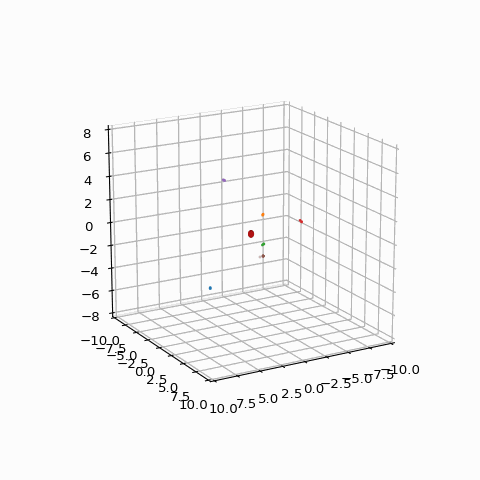

In [20]:
test_animation(dim=3)
gifPath = Path("star.gif")
with open(gifPath, 'rb') as f:
    clear_output(wait=True)
    display.Image(data=f.read(), format='png')